In [1]:
import os
import glob as glob
import matplotlib.pyplot as plt
import cv2
import requests
import random
import numpy as np

np.random.seed(42)

## Hyperparameters and Constants

Here, we define wether to train the model or not and for how many epochs to train for.

If `TRAIN = False`, then the last trained model will be used for inference in the notebook if run end to end.

In [2]:
TRAIN = True
# Number of epochs to train for.
EPOCHS = 25

## Download and Prepare the Dataset

We will use the <a href="https://public.roboflow.com/object-detection/vehicles-openimages" target="_blank">Vehicles-OpenImages</a> dataset for training the custom YOLOv5 object detector.

Let's download the dataset.

In [ ]:
if not os.path.exists('train'):
    !curl -L "https://public.roboflow.com/ds/xKLV14HbTF?key=aJzo7msVta" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
    
    dirs = ['train', 'valid', 'test']

    for i, dir_name in enumerate(dirs):
        all_image_names = sorted(os.listdir(f"{dir_name}/images/"))
        for j, image_name in enumerate(all_image_names):
            if (j % 2) == 0:
                file_name = image_name.split('.jpg')[0]
                os.remove(f"{dir_name}/images/{image_name}")
                os.remove(f"{dir_name}/labels/{file_name}.txt")

The original data had two instances of each image and label file. The rest of the code in the above block deletes the duplicate image and it's corresponding text file containing the label.

The dataset is structured in the following manner:

```
├── data.yaml
├── README.dataset.txt
├── README.roboflow.txt
├── test
│   ├── images
│   └── labels
├── train
│   ├── images
│   └── labels
└── valid
    ├── images
    └── labels

```

## Helper Functions to Download Files

The following function is for downloading any file in the notebook. In further sections of the notebook, we will use it for downloading the inference data.

In [4]:
def download_file(url, save_name):
    url = url
    if not os.path.exists(save_name):
        file = requests.get(url)
        open(save_name, 'wb').write(file.content)
    else: 
        print('File already present, skipping download...')

### The Dataset YAML File

The dataset YAML (`data.yaml`) file containing the path to the training and validation images and labels is already provided. This file will also contain the class names from the dataset.

The dataset contains 5 classes: **'Ambulance', 'Bus', 'Car', 'Motorcycle', 'Truck'**.

The following block shows the contents of the `data.yaml` file.

```yaml
train: ../train/images
val: ../valid/images

nc: 5
names: ['Ambulance', 'Bus', 'Car', 'Motorcycle', 'Truck']
```

### Visualize a Few Ground Truth Images

Before moving forward, let's check out few of the ground truth images. 

The current annotations in the text files are in normalized `[x_center, y_center, width, height]` format. Let's write a function that will convert it back to `[x_min, y_min, x_max, y_max]` format.

In [5]:
class_names = ['Ambulance', 'Bus', 'Car', 'Motorcycle', 'Truck']
colors = np.random.uniform(0, 255, size=(len(class_names), 3))

In [6]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

In [7]:
def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # denormalize the coordinates
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)
        width = xmax - xmin
        height = ymax - ymin
        
        class_name = class_names[int(labels[box_num])]
        
        cv2.rectangle(
            image, 
            (xmin, ymin), (xmax, ymax),
            color=colors[class_names.index(class_name)],
            thickness=2
        ) 

        font_scale = min(1,max(3,int(w/500)))
        font_thickness = min(2, max(10,int(w/50)))
        
        p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))
        # Text width and height
        tw, th = cv2.getTextSize(
            class_name, 
            0, fontScale=font_scale, thickness=font_thickness
        )[0]
        p2 = p1[0] + tw, p1[1] + -th - 10
        cv2.rectangle(
            image, 
            p1, p2,
            color=colors[class_names.index(class_name)],
            thickness=-1,
        )
        cv2.putText(
            image, 
            class_name,
            (xmin+1, ymin-10),
            cv2.FONT_HERSHEY_SIMPLEX,
            font_scale,
            (255, 255, 255),
            font_thickness
        )
    return image

In [8]:
# Function to plot images with the bounding boxes.
def plot(image_paths, label_paths, num_samples):
    all_training_images = glob.glob(image_paths)
    all_training_labels = glob.glob(label_paths)
    all_training_images.sort()
    all_training_labels.sort()
    
    num_images = len(all_training_images)
    
    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        j = random.randint(0,num_images-1)
        image = cv2.imread(all_training_images[j])
        with open(all_training_labels[j], 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label = label_line[0]
                bbox_string = label_line[2:]
                x_c, y_c, w, h = bbox_string.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    plt.subplots_adjust(wspace=0)
    plt.tight_layout()
    plt.show()

In [ ]:
# Visualize a few training images.
plot(
    image_paths='train/images/*', 
    label_paths='train/labels/*',
    num_samples=4,
)

In [ ]:
plot(
    image_paths='/content/train/images/089cc41a901b2653_jpg.rf.d86qKnK017K3pSWOEpdb.jpg', 
    label_paths='/content/train/labels/089cc41a901b2653_jpg.rf.d86qKnK017K3pSWOEpdb.txt',
    num_samples=1,
)

## Helper Functions for Logging

Here, we write the helper functions that we need for logging of the results in the notebook while training the models.

Let's create our custom result directories so that we can easily keep track of them and carry out inference using the proper model.

In [10]:
def set_res_dir():
    # Directory to store results
    res_dir_count = len(glob.glob('runs/train/*'))
    print(f"Current number of result directories: {res_dir_count}")
    if TRAIN:
        RES_DIR = f"results_{res_dir_count+1}"
        print(RES_DIR)
    else:
        RES_DIR = f"results_{res_dir_count}"
    return RES_DIR

**Function to Monitor TensorBoard logs**.

In [11]:
def monitor_tensorboard():
    %load_ext tensorboard
    %tensorboard --logdir runs/train

## Clone YOLOV5 Repository

In [12]:
if not os.path.exists('yolov5'):
    !git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 13710, done.
remote: Counting objects: 100% (512/512), done.
remote: Compressing objects: 100% (169/169), done.
remote: Total 13710 (delta 372), reused 469 (delta 343), pack-reused 13198
Receiving objects: 100% (13710/13710), 13.30 MiB | 30.53 MiB/s, done.
Resolving deltas: 100% (9431/9431), done.


In [13]:
%cd yolov5/
!pwd

/content/yolov5
/content/yolov5


In [ ]:
!pip install -r requirements.txt

## Training using YOLOV5

The next step is to train the neural network model.

### Train a Small (yolov5s) Model

Training all the layers of the small model.

In [18]:
monitor_tensorboard()

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [17]:
RES_DIR = set_res_dir()
if TRAIN:
    !python train.py --data ../data.yaml --weights yolov5s.pt \
    --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR}

Current number of result directories: 1
results_2
train: weights=yolov5s.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=25, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_2, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-188-g209be93 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor

## Check Out the Validation Predictions and Inference

In this section, we will check out the predictions of the validation images saved during training. Along with that, we will also check out inference of images and videos.

### Visualization and Inference Utilities

We will visualize the validation prediction images that are saved during training. The following is the function for that.

In [ ]:
# Function to show validation predictions saved during training.
def show_valid_results(RES_DIR):
    !ls runs/train/{RES_DIR}
    EXP_PATH = f"runs/train/{RES_DIR}"
    validation_pred_images = glob.glob(f"{EXP_PATH}/*_pred.jpg")
    print(validation_pred_images)
    for pred_image in validation_pred_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

The following functions are for carrying out inference on images and videos.

In [ ]:
# Helper function for inference on images.
def inference(RES_DIR, data_path):
    # Directory to store inference results.
    infer_dir_count = len(glob.glob('runs/detect/*'))
    print(f"Current number of inference detection directories: {infer_dir_count}")
    INFER_DIR = f"inference_{infer_dir_count+1}"
    print(INFER_DIR)
    # Inference on images.
    !python detect.py --weights runs/train/{RES_DIR}/weights/best.pt \
    --source {data_path} --name {INFER_DIR}
    return INFER_DIR

We may also need to visualize images in any of the directories. The following function accepts a directory path and plots all the images in them. 

In [ ]:
def visualize(INFER_DIR):
# Visualize inference images.
    INFER_PATH = f"runs/detect/{INFER_DIR}"
    infer_images = glob.glob(f"{INFER_PATH}/*.jpg")
    print(infer_images)
    for pred_image in infer_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

**Visualize validation prediction images.**

In [ ]:
show_valid_results(RES_DIR)

### Inference
In this section, we will carry out inference on unseen images and videos from the internet. 

The images for inference are in the `inference_images` directory.

The videos for inference are in the `inference_videos` directory.

### Download the Images and Videos
Let's download the images and videos that we will carry inference upon.

In [ ]:
download_file('https://learnopencv.s3.us-west-2.amazonaws.com/yolov5_inference_data.zip',
              'inference_data.zip')
if not os.path.exists('inference_images'):
    !unzip -q "inference_data.zip"
else:
    print('Dataset already present')

File already present, skipping download...
Dataset already present


### Inference on Images

**To carry out inference on images, we just need to provide the directory path where all the images are stored, and inference will happen on all images automatically.**

In [ ]:
# Inference on images.
IMAGE_INFER_DIR = inference(RES_DIR, 'inference_images')

Current number of inference detection directories: 0
inference_1
detect: weights=['runs/train/results_1/weights/best.pt'], source=inference_images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_1, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-177-gd059d1d torch 1.11.0+cu113 CUDA:0 (NVIDIA GeForce GTX 1060, 6078MiB)

Fusing layers... 
Model summary: 213 layers, 7023610 parameters, 0 gradients
image 1/4 /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_images/image_1.jpg: 448x640 1 Car, Done. (0.009s)
image 2/4 /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5

In [ ]:
visualize(IMAGE_INFER_DIR)

### Inference on Videos

In [ ]:
inference(RES_DIR, 'inference_videos')

Current number of inference detection directories: 1
inference_2
detect: weights=['runs/train/results_1/weights/best.pt'], source=inference_videos, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_2, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-177-gd059d1d torch 1.11.0+cu113 CUDA:0 (NVIDIA GeForce GTX 1060, 6078MiB)

Fusing layers... 
Model summary: 213 layers, 7023610 parameters, 0 gradients
video 1/4 (1/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 Done. (0.015s)
video 1/4 (2/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_usi

video 1/4 (38/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 1 Ambulance, 1 Bus, 1 Motorcycle, 1 Truck, Done. (0.007s)
video 1/4 (39/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 1 Bus, 1 Car, 1 Truck, Done. (0.007s)
video 1/4 (40/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 1 Bus, 1 Car, 1 Truck, Done. (0.007s)
video 1/4 (41/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 1 Bus, 1 Truck, Done. (0.009s)
video 1/4 (42/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/

video 1/4 (80/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 1 Bus, 3 Cars, Done. (0.007s)
video 1/4 (81/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 1 Bus, 3 Cars, Done. (0.007s)
video 1/4 (82/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 1 Bus, 1 Car, Done. (0.007s)
video 1/4 (83/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 1 Bus, 1 Car, Done. (0.007s)
video 1/4 (84/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 1 

video 1/4 (121/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 1 Bus, Done. (0.007s)
video 1/4 (122/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 1 Bus, Done. (0.007s)
video 1/4 (123/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 1 Bus, Done. (0.007s)
video 1/4 (124/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 1 Bus, Done. (0.007s)
video 1/4 (125/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 1 Bus, Done. (0.007s)
video

video 1/4 (164/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 1 Bus, 3 Cars, Done. (0.007s)
video 1/4 (165/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 1 Bus, 3 Cars, Done. (0.007s)
video 1/4 (166/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 1 Bus, 3 Cars, Done. (0.007s)
video 1/4 (167/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 1 Bus, 2 Cars, Done. (0.007s)
video 1/4 (168/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384

video 1/4 (207/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 3 Cars, Done. (0.007s)
video 1/4 (208/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 3 Cars, Done. (0.007s)
video 1/4 (209/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 1 Bus, 3 Cars, Done. (0.007s)
video 1/4 (210/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 3 Cars, Done. (0.007s)
video 1/4 (211/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 3 Cars, Done. (0

video 1/4 (248/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 4 Cars, Done. (0.007s)
video 1/4 (249/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 3 Cars, Done. (0.007s)
video 1/4 (250/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 4 Cars, Done. (0.007s)
video 1/4 (251/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 3 Cars, Done. (0.007s)
video 1/4 (252/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 3 Cars, Done. (0.007s)


video 1/4 (291/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 Done. (0.007s)
video 1/4 (292/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 Done. (0.007s)
video 1/4 (293/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 Done. (0.007s)
video 1/4 (294/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 Done. (0.007s)
video 1/4 (295/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 Done. (0.007s)
video 1/4 (296/513) /home/sovit/my_data/

video 1/4 (336/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 Done. (0.007s)
video 1/4 (337/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 Done. (0.007s)
video 1/4 (338/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 Done. (0.007s)
video 1/4 (339/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 Done. (0.007s)
video 1/4 (340/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 Done. (0.007s)
video 1/4 (341/513) /home/sovit/my_data/

video 1/4 (381/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 Done. (0.007s)
video 1/4 (382/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 Done. (0.007s)
video 1/4 (383/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 Done. (0.007s)
video 1/4 (384/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 Done. (0.007s)
video 1/4 (385/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 Done. (0.007s)
video 1/4 (386/513) /home/sovit/my_data/

video 1/4 (426/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 Done. (0.007s)
video 1/4 (427/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 Done. (0.007s)
video 1/4 (428/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 Done. (0.007s)
video 1/4 (429/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 Done. (0.007s)
video 1/4 (430/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 1 Car, Done. (0.007s)
video 1/4 (431/513) /home/sovit/m

video 1/4 (469/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 3 Cars, Done. (0.007s)
video 1/4 (470/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 3 Cars, Done. (0.009s)
video 1/4 (471/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 3 Cars, Done. (0.007s)
video 1/4 (472/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 3 Cars, Done. (0.007s)
video 1/4 (473/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 3 Cars, Done. (0.007s)


video 1/4 (510/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 6 Cars, Done. (0.007s)
video 1/4 (511/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 3 Cars, Done. (0.007s)
video 1/4 (512/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 4 Cars, Done. (0.007s)
video 1/4 (513/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 5 Cars, Done. (0.007s)
video 2/4 (1/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 3 Cars, Done. (0.007s)
vi

video 2/4 (39/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 3 Cars, 1 Motorcycle, Done. (0.007s)
video 2/4 (40/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, 1 Motorcycle, Done. (0.008s)
video 2/4 (41/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, 1 Motorcycle, Done. (0.007s)
video 2/4 (42/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, Done. (0.007s)
video 2/4 (43/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2

video 2/4 (81/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 6 Cars, 2 Motorcycles, Done. (0.007s)
video 2/4 (82/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 1 Car, 1 Motorcycle, Done. (0.007s)
video 2/4 (83/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 1 Car, Done. (0.007s)
video 2/4 (84/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 2 Cars, Done. (0.007s)
video 2/4 (85/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 3

video 2/4 (122/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 3 Cars, Done. (0.007s)
video 2/4 (123/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 3 Cars, 1 Motorcycle, Done. (0.007s)
video 2/4 (124/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, Done. (0.008s)
video 2/4 (125/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, Done. (0.007s)
video 2/4 (126/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 3 Cars, 1

video 2/4 (162/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, 2 Motorcycles, Done. (0.007s)
video 2/4 (163/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, Done. (0.007s)
video 2/4 (164/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 5 Cars, Done. (0.007s)
video 2/4 (165/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 5 Cars, Done. (0.007s)
video 2/4 (166/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 3 Cars, 

video 2/4 (205/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 2 Cars, 1 Motorcycle, Done. (0.007s)
video 2/4 (206/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 2 Cars, Done. (0.007s)
video 2/4 (207/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, Done. (0.007s)
video 2/4 (208/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 2 Cars, Done. (0.009s)
video 2/4 (209/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 3 Cars, D

video 2/4 (248/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 2/4 (249/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 2 Cars, 1 Truck, Done. (0.007s)
video 2/4 (250/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 2 Cars, 1 Truck, Done. (0.007s)
video 2/4 (251/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 2 Cars, 1 Truck, Done. (0.007s)
video 2/4 (252/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.m

video 2/4 (290/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 5 Cars, Done. (0.007s)
video 2/4 (291/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 3 Cars, Done. (0.007s)
video 2/4 (292/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, Done. (0.007s)
video 2/4 (293/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 6 Cars, Done. (0.007s)
video 2/4 (294/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 2 Cars, Done. (0.007s)


video 2/4 (331/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 3 Cars, 1 Motorcycle, Done. (0.007s)
video 2/4 (332/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, 1 Motorcycle, Done. (0.007s)
video 2/4 (333/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 1 Bus, 3 Cars, Done. (0.007s)
video 2/4 (334/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, 1 Motorcycle, Done. (0.007s)
video 2/4 (335/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_vi

video 2/4 (374/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 7 Cars, Done. (0.007s)
video 2/4 (375/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, Done. (0.007s)
video 2/4 (376/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, Done. (0.007s)
video 2/4 (377/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 3 Cars, Done. (0.007s)
video 2/4 (378/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 3 Cars, Done. (0.007s)


video 2/4 (416/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, Done. (0.007s)
video 2/4 (417/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 5 Cars, Done. (0.007s)
video 2/4 (418/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, Done. (0.007s)
video 2/4 (419/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 5 Cars, Done. (0.007s)
video 2/4 (420/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, Done. (0.007s)


video 2/4 (459/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, Done. (0.007s)
video 2/4 (460/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, Done. (0.007s)
video 2/4 (461/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 6 Cars, Done. (0.007s)
video 2/4 (462/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, Done. (0.007s)
video 2/4 (463/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, Done. (0.007s)


video 2/4 (500/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, Done. (0.007s)
video 2/4 (501/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, Done. (0.007s)
video 2/4 (502/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 6 Cars, Done. (0.007s)
video 2/4 (503/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 5 Cars, Done. (0.007s)
video 2/4 (504/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, Done. (0.007s)


video 2/4 (542/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, Done. (0.007s)
video 2/4 (543/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, Done. (0.007s)
video 2/4 (544/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, Done. (0.007s)
video 2/4 (545/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, Done. (0.007s)
video 2/4 (546/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 4 Cars, Done. (0.007s)


video 2/4 (584/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 6 Cars, Done. (0.007s)
video 2/4 (585/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 5 Cars, Done. (0.007s)
video 2/4 (586/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 5 Cars, Done. (0.007s)
video 2/4 (587/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 5 Cars, 1 Motorcycle, Done. (0.007s)
video 2/4 (588/610) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_2.mp4: 384x640 3 Cars, 1

video 3/4 (16/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 1 Car, 2 Motorcycles, Done. (0.007s)
video 3/4 (17/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 1 Car, 2 Motorcycles, Done. (0.007s)
video 3/4 (18/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 1 Car, 2 Motorcycles, Done. (0.008s)
video 3/4 (19/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 1 Car, 2 Motorcycles, Done. (0.007s)
video 3/4 (20/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_

video 3/4 (57/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 1 Car, 2 Motorcycles, Done. (0.007s)
video 3/4 (58/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 1 Car, 2 Motorcycles, Done. (0.007s)
video 3/4 (59/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 1 Car, 2 Motorcycles, Done. (0.007s)
video 3/4 (60/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 2 Motorcycles, Done. (0.007s)
video 3/4 (61/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/

video 3/4 (97/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 3 Motorcycles, Done. (0.007s)
video 3/4 (98/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 2 Motorcycles, Done. (0.008s)
video 3/4 (99/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 2 Motorcycles, Done. (0.007s)
video 3/4 (100/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 3 Motorcycles, Done. (0.007s)
video 3/4 (101/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x64

video 3/4 (137/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 1 Car, 3 Motorcycles, Done. (0.007s)
video 3/4 (138/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 2 Cars, 3 Motorcycles, Done. (0.007s)
video 3/4 (139/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 2 Cars, 3 Motorcycles, Done. (0.007s)
video 3/4 (140/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 1 Car, 3 Motorcycles, Done. (0.007s)
video 3/4 (141/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inf

video 3/4 (177/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 1 Car, 1 Motorcycle, Done. (0.007s)
video 3/4 (178/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 2 Cars, 1 Motorcycle, Done. (0.007s)
video 3/4 (179/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 2 Cars, 1 Motorcycle, Done. (0.007s)
video 3/4 (180/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 2 Cars, 1 Motorcycle, Done. (0.007s)
video 3/4 (181/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/infere

video 3/4 (218/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 3 Cars, 1 Motorcycle, Done. (0.007s)
video 3/4 (219/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 3 Cars, 1 Motorcycle, Done. (0.007s)
video 3/4 (220/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 3 Cars, 1 Motorcycle, Done. (0.007s)
video 3/4 (221/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_3.mp4: 384x640 3 Cars, 1 Motorcycle, Done. (0.007s)
video 3/4 (222/246) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/infer

video 4/4 (13/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 Done. (0.007s)
video 4/4 (14/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 Done. (0.007s)
video 4/4 (15/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 Done. (0.007s)
video 4/4 (16/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 Done. (0.007s)
video 4/4 (17/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 Done. (0.007s)
video 4/4 (18/1501) /home/sovit/my_data/

video 4/4 (57/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, Done. (0.007s)
video 4/4 (58/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, Done. (0.007s)
video 4/4 (59/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, Done. (0.007s)
video 4/4 (60/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, Done. (0.007s)
video 4/4 (61/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, Done. (0.007s)
video

video 4/4 (99/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Truck, Done. (0.007s)
video 4/4 (100/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Truck, Done. (0.007s)
video 4/4 (101/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Truck, Done. (0.007s)
video 4/4 (102/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Truck, Done. (0.007s)
video 4/4 (103/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck,

video 4/4 (139/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (140/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (141/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (142/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (143/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4

video 4/4 (180/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Trucks, Done. (0.007s)
video 4/4 (181/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 3 Trucks, Done. (0.007s)
video 4/4 (182/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 3 Trucks, Done. (0.007s)
video 4/4 (183/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 2 Trucks, Done. (0.007s)
video 4/4 (184/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x

video 4/4 (220/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, Done. (0.007s)
video 4/4 (221/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (222/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, Done. (0.007s)
video 4/4 (223/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, Done. (0.007s)
video 4/4 (224/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, Done.

video 4/4 (263/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, Done. (0.007s)
video 4/4 (264/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, Done. (0.007s)
video 4/4 (265/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, Done. (0.007s)
video 4/4 (266/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, Done. (0.007s)
video 4/4 (267/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, Done. (0.0

video 4/4 (304/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, Done. (0.007s)
video 4/4 (305/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, Done. (0.007s)
video 4/4 (306/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, Done. (0.007s)
video 4/4 (307/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 Done. (0.007s)
video 4/4 (308/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, Done. (0.007s)
video 4

video 4/4 (344/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 5 Cars, Done. (0.007s)
video 4/4 (345/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 4 Cars, Done. (0.007s)
video 4/4 (346/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 4 Cars, Done. (0.007s)
video 4/4 (347/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 4 Cars, Done. (0.008s)
video 4/4 (348/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 4 Cars, Done. (0.0

video 4/4 (386/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, Done. (0.007s)
video 4/4 (387/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, Done. (0.007s)
video 4/4 (388/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, Done. (0.007s)
video 4/4 (389/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, Done. (0.007s)
video 4/4 (390/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, Done. (0.0

video 4/4 (427/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (428/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (429/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, 1 Truck, Done. (0.007s)
video 4/4 (430/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, 1 Truck, Done. (0.007s)
video 4/4 (431/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video

video 4/4 (467/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, 1 Truck, Done. (0.007s)
video 4/4 (468/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 4 Cars, 1 Truck, Done. (0.007s)
video 4/4 (469/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 3 Cars, 1 Truck, Done. (0.007s)
video 4/4 (470/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 4 Cars, 1 Truck, Done. (0.007s)
video 4/4 (471/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/vid

video 4/4 (507/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (508/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (509/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Truck, Done. (0.007s)
video 4/4 (510/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Truck, Done. (0.007s)
video 4/4 (511/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 

video 4/4 (549/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, Done. (0.007s)
video 4/4 (550/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, Done. (0.007s)
video 4/4 (551/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, Done. (0.007s)
video 4/4 (552/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, Done. (0.007s)
video 4/4 (553/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, Done. (0.007

video 4/4 (589/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Ambulance, 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (590/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Ambulance, 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (591/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Ambulance, 2 Cars, 1 Truck, Done. (0.007s)
video 4/4 (592/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Ambulance, 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (593/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_usin

video 4/4 (628/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (629/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Truck, Done. (0.007s)
video 4/4 (630/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Truck, Done. (0.007s)
video 4/4 (631/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Trucks, Done. (0.007s)
video 4/4 (632/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Truc

video 4/4 (670/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Truck, Done. (0.007s)
video 4/4 (671/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 Done. (0.007s)
video 4/4 (672/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 Done. (0.007s)
video 4/4 (673/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 Done. (0.007s)
video 4/4 (674/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 Done. (0.007s)
video 4/4 (675/1501) /home

video 4/4 (712/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Truck, Done. (0.007s)
video 4/4 (713/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 Done. (0.007s)
video 4/4 (714/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, Done. (0.007s)
video 4/4 (715/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, Done. (0.007s)
video 4/4 (716/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, Done. (0.007s)
video

video 4/4 (753/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Truck, Done. (0.007s)
video 4/4 (754/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Ambulance, 1 Truck, Done. (0.007s)
video 4/4 (755/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Ambulance, 1 Truck, Done. (0.007s)
video 4/4 (756/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Truck, Done. (0.007s)
video 4/4 (757/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.m

video 4/4 (797/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, Done. (0.007s)
video 4/4 (798/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, Done. (0.007s)
video 4/4 (799/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, Done. (0.007s)
video 4/4 (800/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 Done. (0.007s)
video 4/4 (801/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 Done. (0.007s)
video 4/4 (802

video 4/4 (838/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (839/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Truck, Done. (0.007s)
video 4/4 (840/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (841/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Truck, Done. (0.007s)
video 4/4 (842/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 

video 4/4 (879/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, 1 Truck, Done. (0.007s)
video 4/4 (880/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, 1 Truck, Done. (0.007s)
video 4/4 (881/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (882/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, 2 Trucks, Done. (0.007s)
video 4/4 (883/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/vid

video 4/4 (920/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, 1 Truck, Done. (0.007s)
video 4/4 (921/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 3 Cars, 1 Truck, Done. (0.007s)
video 4/4 (922/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 4 Cars, 1 Truck, Done. (0.007s)
video 4/4 (923/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 3 Cars, 1 Truck, Done. (0.007s)
video 4/4 (924/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/vid

video 4/4 (960/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, 1 Truck, Done. (0.007s)
video 4/4 (961/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 3 Cars, 1 Truck, Done. (0.007s)
video 4/4 (962/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, 1 Truck, Done. (0.007s)
video 4/4 (963/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, 1 Truck, Done. (0.007s)
video 4/4 (964/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/vid

video 4/4 (1001/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (1002/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (1003/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (1004/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (1005/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/vi

video 4/4 (1041/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, 1 Truck, Done. (0.007s)
video 4/4 (1042/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, 1 Truck, Done. (0.007s)
video 4/4 (1043/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, 1 Truck, Done. (0.007s)
video 4/4 (1044/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, 1 Truck, Done. (0.007s)
video 4/4 (1045/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_video

video 4/4 (1085/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 3 Cars, Done. (0.007s)
video 4/4 (1086/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 4 Cars, Done. (0.007s)
video 4/4 (1087/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 3 Cars, Done. (0.007s)
video 4/4 (1088/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, Done. (0.007s)
video 4/4 (1089/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 3 Cars, Done.

video 4/4 (1126/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, Done. (0.007s)
video 4/4 (1127/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 3 Cars, Done. (0.007s)
video 4/4 (1128/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 3 Cars, Done. (0.007s)
video 4/4 (1129/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, Done. (0.007s)
video 4/4 (1130/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, Done. (

video 4/4 (1167/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 4 Cars, Done. (0.007s)
video 4/4 (1168/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 4 Cars, Done. (0.007s)
video 4/4 (1169/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, Done. (0.007s)
video 4/4 (1170/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, Done. (0.007s)
video 4/4 (1171/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 Done. (0.007s

video 4/4 (1210/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 2 Trucks, Done. (0.007s)
video 4/4 (1211/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (1212/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (1213/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (1214/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/v

video 4/4 (1251/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Trucks, Done. (0.007s)
video 4/4 (1252/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 2 Trucks, Done. (0.007s)
video 4/4 (1253/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, 2 Trucks, Done. (0.007s)
video 4/4 (1254/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 2 Trucks, Done. (0.007s)
video 4/4 (1255/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/vide

video 4/4 (1294/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, Done. (0.007s)
video 4/4 (1295/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, Done. (0.007s)
video 4/4 (1296/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, Done. (0.007s)
video 4/4 (1297/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, Done. (0.007s)
video 4/4 (1298/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, Done.

video 4/4 (1337/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Truck, Done. (0.007s)
video 4/4 (1338/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Truck, Done. (0.007s)
video 4/4 (1339/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Truck, Done. (0.007s)
video 4/4 (1340/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Truck, Done. (0.007s)
video 4/4 (1341/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Truck, 

video 4/4 (1378/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (1379/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (1380/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (1381/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (1382/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/vi

video 4/4 (1419/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (1420/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (1421/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (1422/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (1423/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/vi

video 4/4 (1459/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, 1 Truck, Done. (0.007s)
video 4/4 (1460/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (1461/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 2 Cars, 1 Truck, Done. (0.007s)
video 4/4 (1462/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (1463/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/

video 4/4 (1499/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Truck, Done. (0.007s)
video 4/4 (1500/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Ambulance, 1 Car, 1 Truck, Done. (0.007s)
video 4/4 (1501/1501) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_4.mp4: 384x640 1 Car, 1 Truck, Done. (0.007s)
Speed: 0.3ms pre-process, 7.2ms inference, 0.7ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/inference_2


'inference_2'

## Training and Inference using  Medium Model

In [ ]:
monitor_tensorboard()

In [ ]:
RES_DIR = set_res_dir()
if TRAIN:
    !python train.py --data ../data.yaml --weights yolov5m.pt \
    --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR}

Current number of result directories: 1
results_2
train: weights=yolov5m.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=25, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_2, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 27 commits. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to update.
YOLOv5 🚀 v6.1-177-gd059d1d torch 1.11.0+cu113 CUDA:0 (NVIDIA GeForce GTX 1060, 6078MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=

               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all        125        227      0.351      0.451      0.407      0.234

     Epoch   gpu_mem       box       obj       cls    labels  img_size
      9/24     5.44G   0.04391   0.02324   0.01619        25       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all        125        227      0.454       0.51      0.457      0.276

     Epoch   gpu_mem       box       obj       cls    labels  img_size
     10/24     5.52G   0.04311   0.02166   0.01398        20       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all        125        227      0.482      0.434      0.434      0.268

     Epoch   gpu_mem       box       obj       cls    labels  img_size
     11/24     5.53G   0.04287   0.02324   0.01336        25       640: 100%|███
               Class     Images     L

In [ ]:
# Inference on images.
IMAGE_INFER_DIR = inference(RES_DIR, 'inference_images')

Current number of inference detection directories: 2
inference_3
detect: weights=['runs/train/results_2/weights/best.pt'], source=inference_images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_3, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-177-gd059d1d torch 1.11.0+cu113 CUDA:0 (NVIDIA GeForce GTX 1060, 6078MiB)

Fusing layers... 
Model summary: 290 layers, 20869098 parameters, 0 gradients
image 1/4 /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_images/image_1.jpg: 448x640 2 Ambulances, 1 Car, 4 Trucks, Done. (0.021s)
image 2/4 /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detect

In [ ]:
visualize(IMAGE_INFER_DIR)

In [ ]:
inference(RES_DIR, 'inference_videos')

## Freezing Layers and Training the Medium Model

The Medium model (yolov5m) contains 25 blocks layers in total more than 20 million parameters. We need not train all the layers. Let's freeze a few layers and train again. This will result in faster iteration per epoch. Here, we freeze the first 15 blocks.

In [ ]:
monitor_tensorboard()

In [ ]:
RES_DIR = set_res_dir()
if TRAIN:
    !python train.py --data ../data.yaml --weights yolov5m.pt \
    --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR} \
    --freeze 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14

Current number of result directories: 2
results_3
train: weights=yolov5m.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=25, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_3, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 27 commits. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to update.
YOLOv5 🚀 v6.1-177-gd059d1d torch 1.11.0+cu113 CUDA:0 (NVIDIA GeForce GTX 1060, 6078MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_m

albumentations: Blur(always_apply=False, p=0.01, blur_limit=(3, 7)), MedianBlur(always_apply=False, p=0.01, blur_limit=(3, 7)), ToGray(always_apply=False, p=0.01), CLAHE(always_apply=False, p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))
train: Scanning '/home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_obj
val: Scanning '/home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_objec
Plotting labels to runs/train/results_3/labels.jpg... 

AutoAnchor: 3.85 anchors/target, 1.000 Best Possible Recall (BPR). Current anchors are a good fit to dataset ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/train/results_3
Starting training for 25 epochs...

     Epoch   gpu_mem       box       obj       cls    labels  img_size
      0/24     1.73G    0.1007   0.03514   0.04814        20       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all        125        227      0.165       0.

     23/24     2.45G   0.03313   0.02219    0.0164        19       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all        125        227      0.642      0.629      0.639      0.447

     Epoch   gpu_mem       box       obj       cls    labels  img_size
     24/24     2.45G   0.03252    0.0219   0.01616        37       640: 100%|███
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all        125        227      0.631      0.631      0.637      0.451

25 epochs completed in 0.231 hours.
Optimizer stripped from runs/train/results_3/weights/last.pt, 42.3MB
Optimizer stripped from runs/train/results_3/weights/best.pt, 42.3MB

Validating runs/train/results_3/weights/best.pt...
Fusing layers... 
Model summary: 290 layers, 20869098 parameters, 0 gradients
               Class     Images     Labels          P          R     mAP@.5 mAP@
                 all        125        227  

In [ ]:
# Inference on images.
IMAGE_INFER_DIR = inference(RES_DIR, 'inference_images')

Current number of inference detection directories: 4
inference_5
detect: weights=['runs/train/results_3/weights/best.pt'], source=inference_images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_5, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-177-gd059d1d torch 1.11.0+cu113 CUDA:0 (NVIDIA GeForce GTX 1060, 6078MiB)

Fusing layers... 
Model summary: 290 layers, 20869098 parameters, 0 gradients
image 1/4 /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_images/image_1.jpg: 448x640 3 Buss, 5 Cars, Done. (0.021s)
image 2/4 /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_us

['runs/detect/inference_5/image_1.jpg', 'runs/detect/inference_5/image_4.jpg', 'runs/detect/inference_5/image_2.jpg', 'runs/detect/inference_5/image_3.jpg']


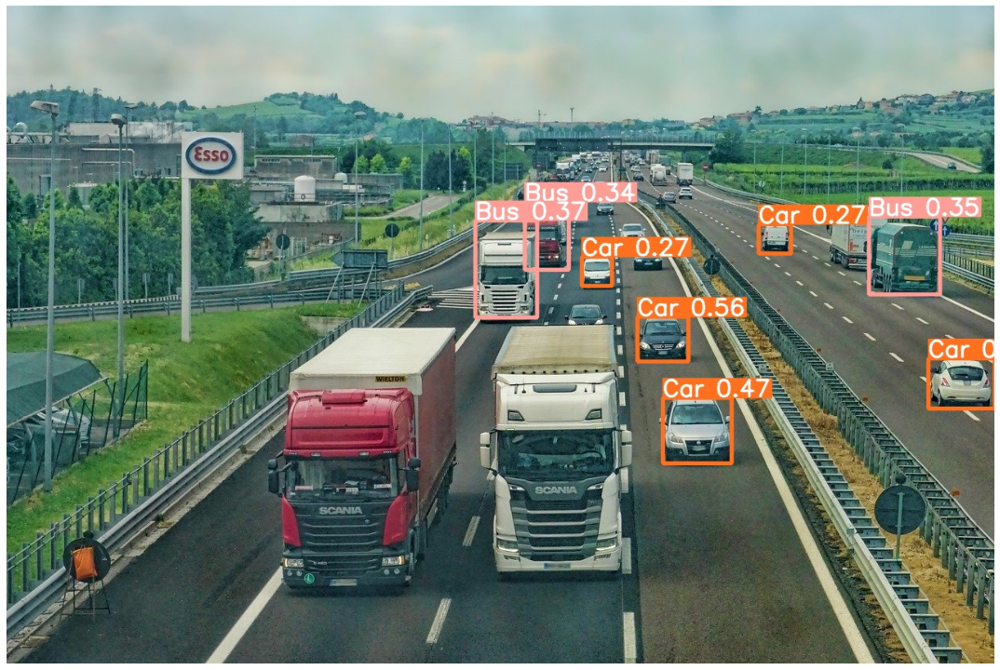

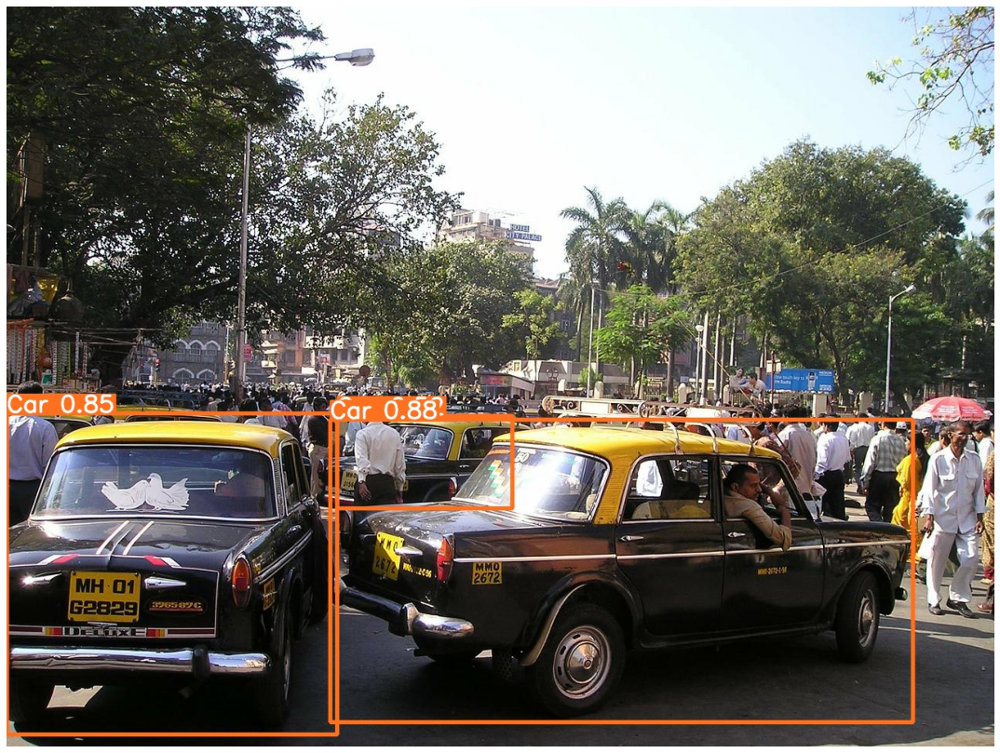

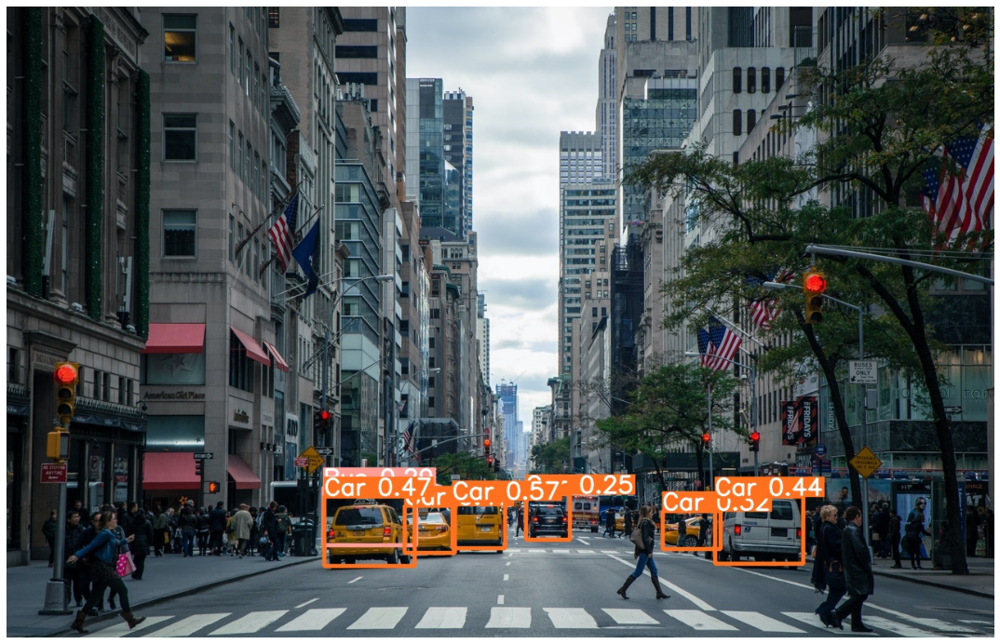

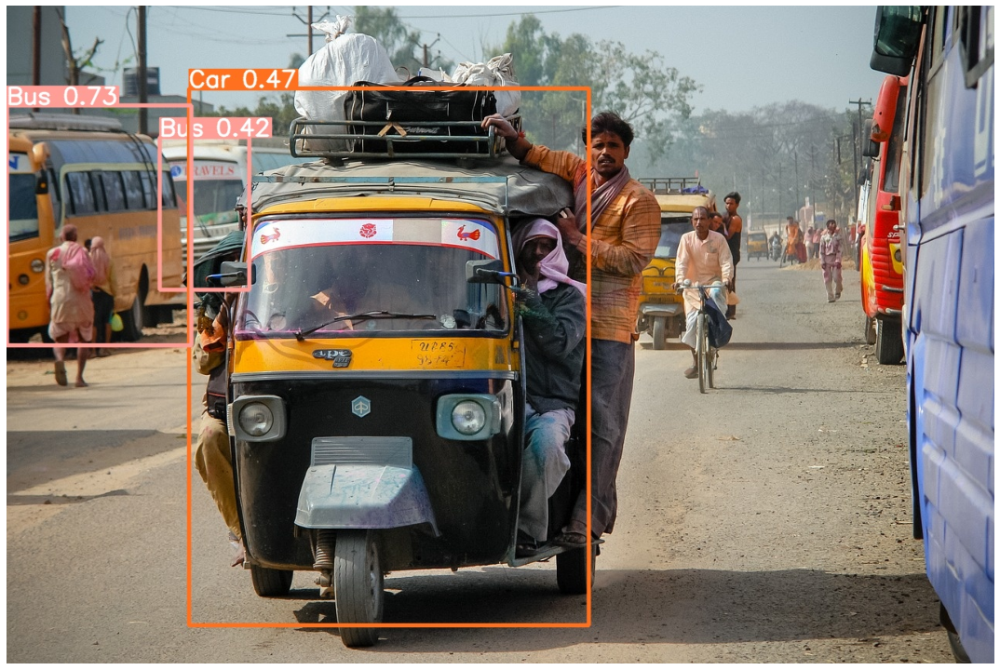

In [ ]:
visualize(IMAGE_INFER_DIR)

In [ ]:
inference(RES_DIR, 'inference_videos')